<a href="https://colab.research.google.com/github/ChinnakotlaSreeharsha/Website_traffic_analysis/blob/main/website_traffic_forcasting_unique_visits_ipynb_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings('ignore')
import datetime
from datetime import date

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
sns.set_style("whitegrid")

# import chart_studio.plotly as py
import cufflinks as cf
import plotly.express as px

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

cf.go_offline()

import plotly.graph_objects as go

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
import xgboost as xg
# from prophet import Prophet

Importing the required dataset, renaming the columns, removing the commas from the columns and converting their
data types

In [2]:
df=pd.read_csv('/content/website (1).csv')

df.rename(columns = {'Day.Of.Week':'day_of_week'
                    ,'Page.Loads':'page_loads'
                    ,'Unique.Visits':'unique_visits'
                    ,'First.Time.Visits':'first_visits'
                    ,'Returning.Visits':'returning_visits'}, inplace = True)

df=df.replace(',','',regex=True)

df['page_loads']=df['page_loads'].astype(int)
df['unique_visits']=df['unique_visits'].astype(int)
df['first_visits']=df['first_visits'].astype(int)
df['returning_visits']=df['returning_visits'].astype(int)

df

,Row,Day,day_of_week,Date,page_loads,unique_visits,first_visits,returning_visits
0,1,Sunday,1,9/14/2014,2146,1582,1430,152
1,2,Monday,2,9/15/2014,3621,2528,2297,231
2,3,Tuesday,3,9/16/2014,3698,2630,2352,278
3,4,Wednesday,4,9/17/2014,3667,2614,2327,287
4,5,Thursday,5,9/18/2014,3316,2366,2130,236
...,...,...,...,...,...,...,...,...
2162,2163,Saturday,7,8/15/2020,2221,1696,1373,323
2163,2164,Sunday,1,8/16/2020,2724,2037,1686,351
2164,2165,Monday,2,8/17/2020,3456,2638,2181,457
2165,2166,Tuesday,3,8/18/2020,3581,2683,2184,499


from matplotlib import pyplot as plt
df['Row'].plot(kind='hist', bins=20, title='Row')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
df['day_of_week'].plot(kind='hist', bins=20, title='day_of_week')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
df['page_loads'].plot(kind='hist', bins=20, title='page_loads')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
df['unique_visits'].plot(kind='hist', bins=20, title='unique_visits')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
import seaborn as sns
df.groupby('Day').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
df.plot(kind='scatter', x='Row', y='day_of_week', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
df.plot(kind='scatter', x='day_of_week', y='page_loads', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
df.plot(kind='scatter', x='page_loads', y='unique_visits', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
df.plot(kind='scatter', x='unique_visits', y='first_visits', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Row']
  ys = series['day_of_week']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = df.sort_values('Row', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Day')):
  _plot_series(series, series_name, i)
  fig.legend(title='Day', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Row')
plt.ylabel('day_of_week')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Row']
  ys = series['page_loads']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = df.sort_values('Row', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Day')):
  _plot_series(series, series_name, i)
  fig.legend(title='Day', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Row')
plt.ylabel('page_loads')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Row']
  ys = series['unique_visits']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = df.sort_values('Row', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Day')):
  _plot_series(series, series_name, i)
  fig.legend(title='Day', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Row')
plt.ylabel('unique_visits')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Row']
  ys = series['first_visits']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = df.sort_values('Row', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Day')):
  _plot_series(series, series_name, i)
  fig.legend(title='Day', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Row')
plt.ylabel('first_visits')

from matplotlib import pyplot as plt
df['Row'].plot(kind='line', figsize=(8, 4), title='Row')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
df['day_of_week'].plot(kind='line', figsize=(8, 4), title='day_of_week')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
df['page_loads'].plot(kind='line', figsize=(8, 4), title='page_loads')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
df['unique_visits'].plot(kind='line', figsize=(8, 4), title='unique_visits')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(df['Day'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(df, x='Row', y='Day', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(df['Day'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(df, x='day_of_week', y='Day', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(df['Day'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(df, x='page_loads', y='Day', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(df['Day'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(df, x='unique_visits', y='Day', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

Checking for the null values if any

In [3]:
df.isna().sum()

Row                 0
Day                 0
day_of_week         0
Date                0
page_loads          0
unique_visits       0
first_visits        0
returning_visits    0
dtype: int64

Checking for duplicate values if any

In [4]:
df.duplicated().sum()

0

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2167 entries, 0 to 2166
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Row               2167 non-null   int64 
 1   Day               2167 non-null   object
 2   day_of_week       2167 non-null   int64 
 3   Date              2167 non-null   object
 4   page_loads        2167 non-null   int64 
 5   unique_visits     2167 non-null   int64 
 6   first_visits      2167 non-null   int64 
 7   returning_visits  2167 non-null   int64 
dtypes: int64(6), object(2)
memory usage: 135.6+ KB


generating line plot for visualizing the trend of page loads and visits over time series, it seems that page loads and visits have a constant fluctuation, means they have trend over time and are correlated to each other.

In [6]:
px.line(df,x='Date',y=['page_loads' ,'unique_visits' ,'first_visits' ,'returning_visits'],
       labels={'value':'Visits'}
       ,title='Page Loads & visitors over Time')

This histogram plot represent the sum of unique visits for each day in the week against count of unique visits for each day in the week.

but from this plot it's hard to estimate which day had the most unique visitors, so we will explore more deeper.

In [7]:
px.histogram(df,x='unique_visits',color='Day',title='unique visits for each day')

With this bar plot it is clear that tuesday, wednesday, monday and thursday are the days in a week when extensive amount of traffic come to this website  

In [8]:
day_imp=df.groupby(['Day'])['unique_visits'].agg(['sum']).sort_values(by='sum',ascending=False)
px.bar(day_imp,labels={'value':'sum of unique visits'},title='Sum of Unique visits for each day')

sum of unique visits for each week day over time series, we know which days get the most traffic but on what time intervals ? this graph answers to that question.

time intervals are grouped according to their relation with unique visits and days, now we can understand that in  which days, months and years did the website get the most traffic.

In [9]:
px.histogram(df,x='Date',y='unique_visits',color='Day',title='Sum of unique visits for each day over Time')

get the sum of page_loads 	unique_visits 	first_visits 	returning_visits related to each of their days

In [10]:
sums=df.groupby(['Day'])[['page_loads' ,'unique_visits' ,'first_visits' ,'returning_visits']].sum().sort_values(
    by='unique_visits',ascending=False)
sums

,page_loads,unique_visits,first_visits,returning_visits
Day,,,,
Tuesday,1536154,1097181,907752,189429
Wednesday,1517114,1085624,897602,188022
Monday,1502161,1072112,886036,186076
Thursday,1437269,1028214,848921,179293
Friday,1149437,817852,668805,149047
Sunday,1006564,725794,604198,121596
Saturday,772817,552105,456449,95656


from matplotlib import pyplot as plt
sums['page_loads'].plot(kind='hist', bins=20, title='page_loads')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
sums['unique_visits'].plot(kind='hist', bins=20, title='unique_visits')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
sums['first_visits'].plot(kind='hist', bins=20, title='first_visits')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
sums['returning_visits'].plot(kind='hist', bins=20, title='returning_visits')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
sums.plot(kind='scatter', x='page_loads', y='unique_visits', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
sums.plot(kind='scatter', x='unique_visits', y='first_visits', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
sums.plot(kind='scatter', x='first_visits', y='returning_visits', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
sums['page_loads'].plot(kind='line', figsize=(8, 4), title='page_loads')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
sums['unique_visits'].plot(kind='line', figsize=(8, 4), title='unique_visits')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
sums['first_visits'].plot(kind='line', figsize=(8, 4), title='first_visits')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
sums['returning_visits'].plot(kind='line', figsize=(8, 4), title='returning_visits')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

this grouped bar chart comes from the crosstab above and it shows the sum of page_loads, unique_visits, first_visits, returning_visits for each day

In [11]:
px.bar(sums,barmode='group',title='Sum of page loads and visits for each of their days')

This is a heatmap graph that shows the correlation of each datapoint from page_loads, unique_visits, first_visits , returning_visits columns, first visits seems to have a great correlation with unique visits.

The Yellow points indicate a great correlation between first visits and unique visits, but we don't how much let's find that out

In [12]:
px.density_heatmap(df, x='Date',y=['page_loads' ,'unique_visits' ,'first_visits' ,'returning_visits']
#                    color_continuous_scale="Viridis"
                   ,marginal_x="histogram", marginal_y="histogram",title='Correlation for each data point')

this shows the paired correlation of page_loads 	unique_visits 	first_visits 	returning_visits columns with annotated values we know that first visits and unique visits are correlated by 0.99 which is a great correlation and page loads have a good correlation with our target variable as well.

let's see how the correlation looks like in our next plot.

<Axes: >

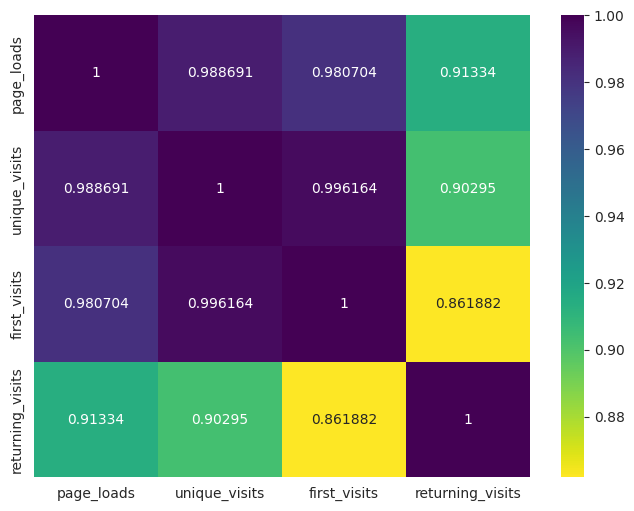

In [13]:
fig, ax = plt.subplots()
fig.set_size_inches(8, 6)
sns.heatmap(df[['page_loads' ,'unique_visits' ,'first_visits' ,'returning_visits']].corr(),
            annot=True,
            cmap='viridis_r',
            fmt='g')

this scatter matrix plot shows the paired plot of page_loads 	unique_visits 	first_visits 	returning_visits we can see that unique visits and first visits have a straight upward line, that means that first visits are increasing as the unique visits increase. we can also other pairs and identify their level of correlation visualy.

The last thing we need is to visualize the trend line.

In [14]:
px.scatter_matrix(df[['page_loads' ,'unique_visits' ,'first_visits' ,'returning_visits']])

Okay now we have the regression line pointing upward which confirms the trend between these two columns

In [15]:
px.scatter(
    df, x='first_visits', y='unique_visits',opacity=0.4,
    trendline='ols', trendline_color_override='purple',title="Regression line for unique visits and first visits"
)

there are no outliears that need to be dealt with, data is tightly packed with no dispersion except for returning visits, this column was also less correlated with our target variable.  

In [16]:
px.violin(df,y=['page_loads' ,'unique_visits' ,'first_visits' ,'returning_visits'],box=True,points='all')

starting the feature engineering.

we only need these columns

In [17]:
pred_df=df[['page_loads' ,'unique_visits' ,'first_visits' ,'returning_visits','Day']]

Tuesday, wednesday, thursday and monday are the days when our website received the most traffic so we will create a feature days_f of them 1 value will define their existence and 0 will define the rest of the days.

In [18]:
pred_df['days_f']=np.where((df['Day']=='Tuesday') |
                      (df['Day']=='Wednesday') |
                      (df['Day']=='Thursday') |
                      (df['Day']=='Monday'),1,0)

pred_df

,page_loads,unique_visits,first_visits,returning_visits,Day,days_f
0,2146,1582,1430,152,Sunday,0
1,3621,2528,2297,231,Monday,1
2,3698,2630,2352,278,Tuesday,1
3,3667,2614,2327,287,Wednesday,1
4,3316,2366,2130,236,Thursday,1
...,...,...,...,...,...,...
2162,2221,1696,1373,323,Saturday,0
2163,2724,2037,1686,351,Sunday,0
2164,3456,2638,2181,457,Monday,1
2165,3581,2683,2184,499,Tuesday,1


from matplotlib import pyplot as plt
pred_df['page_loads'].plot(kind='hist', bins=20, title='page_loads')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
pred_df['unique_visits'].plot(kind='hist', bins=20, title='unique_visits')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
pred_df['first_visits'].plot(kind='hist', bins=20, title='first_visits')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
pred_df['returning_visits'].plot(kind='hist', bins=20, title='returning_visits')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
pred_df.plot(kind='scatter', x='page_loads', y='unique_visits', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
pred_df.plot(kind='scatter', x='unique_visits', y='first_visits', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
pred_df.plot(kind='scatter', x='first_visits', y='returning_visits', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
pred_df.plot(kind='scatter', x='returning_visits', y='days_f', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
pred_df['page_loads'].plot(kind='line', figsize=(8, 4), title='page_loads')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
pred_df['unique_visits'].plot(kind='line', figsize=(8, 4), title='unique_visits')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
pred_df['first_visits'].plot(kind='line', figsize=(8, 4), title='first_visits')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
pred_df['returning_visits'].plot(kind='line', figsize=(8, 4), title='returning_visits')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

Multi Linear Regression model

In [19]:
pred_df.drop('Day',axis=1,inplace=True)
# drop the days column as we don't need it anymore

In [20]:
pred_df.head(5)

,page_loads,unique_visits,first_visits,returning_visits,days_f
0,2146,1582,1430,152,0
1,3621,2528,2297,231,1
2,3698,2630,2352,278,1
3,3667,2614,2327,287,1
4,3316,2366,2130,236,1


from matplotlib import pyplot as plt
_df_0['page_loads'].plot(kind='hist', bins=20, title='page_loads')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
_df_1['unique_visits'].plot(kind='hist', bins=20, title='unique_visits')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
_df_2['first_visits'].plot(kind='hist', bins=20, title='first_visits')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
_df_3['returning_visits'].plot(kind='hist', bins=20, title='returning_visits')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
_df_4.plot(kind='scatter', x='page_loads', y='unique_visits', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
_df_5.plot(kind='scatter', x='unique_visits', y='first_visits', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
_df_6.plot(kind='scatter', x='first_visits', y='returning_visits', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
_df_7.plot(kind='scatter', x='returning_visits', y='days_f', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['days_f']
  ys = series['page_loads']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_8.sort_values('days_f', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('days_f')
plt.ylabel('page_loads')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['days_f']
  ys = series['unique_visits']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_9.sort_values('days_f', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('days_f')
plt.ylabel('unique_visits')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['days_f']
  ys = series['first_visits']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_10.sort_values('days_f', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('days_f')
plt.ylabel('first_visits')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['days_f']
  ys = series['returning_visits']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_11.sort_values('days_f', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('days_f')
plt.ylabel('returning_visits')

from matplotlib import pyplot as plt
_df_12['page_loads'].plot(kind='line', figsize=(8, 4), title='page_loads')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
_df_13['unique_visits'].plot(kind='line', figsize=(8, 4), title='unique_visits')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
_df_14['first_visits'].plot(kind='line', figsize=(8, 4), title='first_visits')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
_df_15['returning_visits'].plot(kind='line', figsize=(8, 4), title='returning_visits')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

separate the independent variable and dependent / target variable

In [21]:
X2=pred_df[['page_loads','first_visits' ,'returning_visits','days_f']]
y2=pred_df['unique_visits']

split the dataset in train and test samples now

In [22]:
X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.3,random_state=42)

train the model with train sample

In [23]:
regressor2 = LinearRegression(fit_intercept=False)
regressor2.fit(X_train, y_train)

LinearRegression(fit_intercept=False)

In [24]:
y_pred2 = regressor2.predict(X_test)

In [25]:
lr2 = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred2})
lr2

,Actual,Predicted
1486,4173,4173.0
1602,1902,1902.0
1460,2870,2870.0
1134,2142,2142.0
1513,4329,4329.0
...,...,...
439,2579,2579.0
271,2494,2494.0
244,1818,1818.0
1159,3332,3332.0


from matplotlib import pyplot as plt
lr2['Actual'].plot(kind='hist', bins=20, title='Actual')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
lr2['Predicted'].plot(kind='hist', bins=20, title='Predicted')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
lr2.plot(kind='scatter', x='Actual', y='Predicted', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
lr2['Actual'].plot(kind='line', figsize=(8, 4), title='Actual')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
lr2['Predicted'].plot(kind='line', figsize=(8, 4), title='Predicted')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

visualize the actual and predicted values

<Axes: >

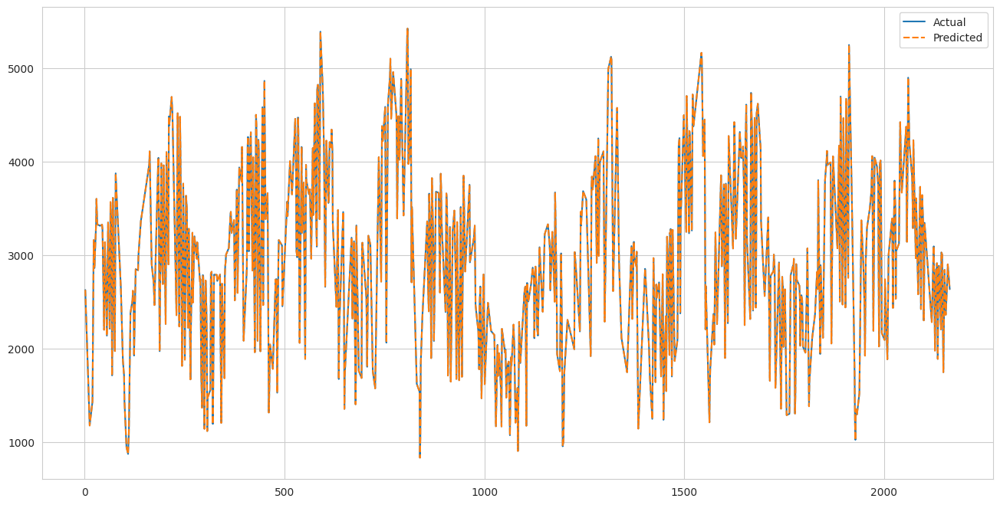

In [26]:
plt.figure(figsize=(16,8))
sns.lineplot(data=lr2)

get the accuacy score of the model.

In [27]:
regressor2.score(X_test,y_test)*100

100.0

Support Vector Regression

In [28]:
svr_rbf = SVR(kernel='rbf', C=1e3, gamma=0.00001)
svr_rbf.fit(X_train, y_train)

SVR(C=1000.0, gamma=1e-05)

In [29]:
y_pred3 = svr_rbf.predict(X_test)

In [30]:
svr = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred3})
svr

,Actual,Predicted
1486,4173,4173.783532
1602,1902,1904.847560
1460,2870,2870.181094
1134,2142,2142.904123
1513,4329,4328.316673
...,...,...
439,2579,2578.897313
271,2494,2493.887467
244,1818,1816.932763
1159,3332,3331.902324


from matplotlib import pyplot as plt
svr['Actual'].plot(kind='hist', bins=20, title='Actual')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
svr['Predicted'].plot(kind='hist', bins=20, title='Predicted')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
svr.plot(kind='scatter', x='Actual', y='Predicted', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
svr['Actual'].plot(kind='line', figsize=(8, 4), title='Actual')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
svr['Predicted'].plot(kind='line', figsize=(8, 4), title='Predicted')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

<Axes: >

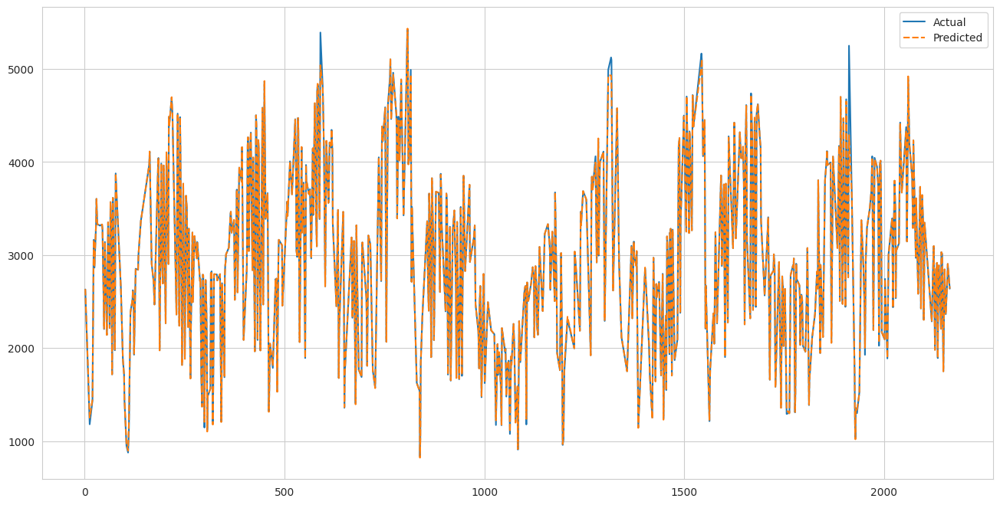

In [31]:
plt.figure(figsize=(16,8))
sns.lineplot(data=svr)

In [32]:
svr_rbf.score(X_test,y_test)*100

99.80054455767926

Decision Tree Regression

In [33]:
dtr = DecisionTreeRegressor(random_state=0)
dtr.fit(X_train, y_train)

DecisionTreeRegressor(random_state=0)

In [34]:
dtr_pred = dtr.predict(X_test)

In [35]:
dtr_g = pd.DataFrame({'Actual': y_test, 'Predicted': dtr_pred})
dtr_g

,Actual,Predicted
1486,4173,4140.0
1602,1902,1929.0
1460,2870,2871.0
1134,2142,2198.0
1513,4329,4330.0
...,...,...
439,2579,2572.0
271,2494,2518.0
244,1818,1826.0
1159,3332,3341.0


from matplotlib import pyplot as plt
dtr_g['Actual'].plot(kind='hist', bins=20, title='Actual')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
dtr_g['Predicted'].plot(kind='hist', bins=20, title='Predicted')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
dtr_g.plot(kind='scatter', x='Actual', y='Predicted', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
dtr_g['Actual'].plot(kind='line', figsize=(8, 4), title='Actual')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
dtr_g['Predicted'].plot(kind='line', figsize=(8, 4), title='Predicted')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

<Axes: >

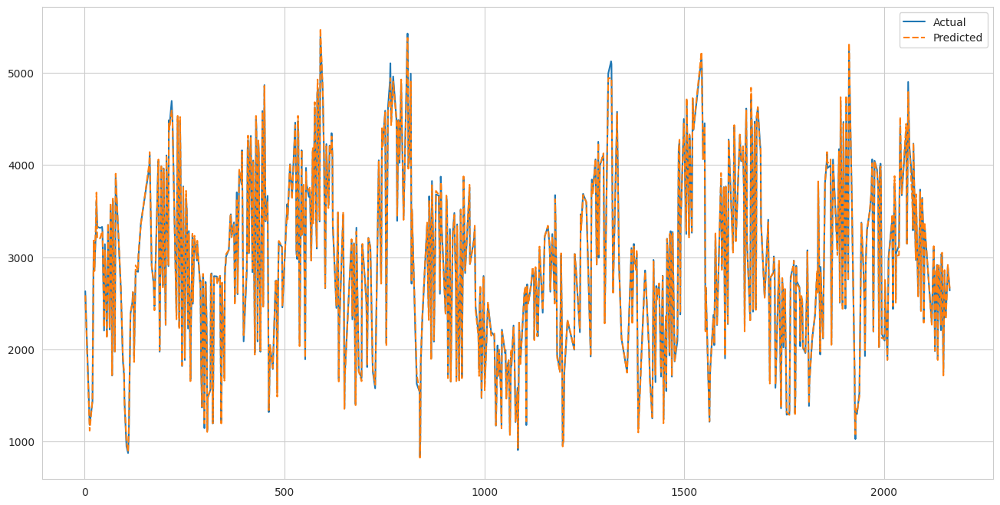

In [36]:
plt.figure(figsize=(16,8))
sns.lineplot(data=dtr_g)

In [37]:
dtr.score(X_test,y_test)*100

99.85504139672305

XGboost regression

In [38]:
xgb_r = xg.XGBRegressor(objective ='reg:squarederror',n_estimators = 10, seed = 123)
xgb_r.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=10, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [39]:
xgb_pred = xgb_r.predict(X_test)

In [40]:
xgb_df = pd.DataFrame({'Actual': y_test, 'Predicted': xgb_pred})
xgb_df

,Actual,Predicted
1486,4173,4110.772461
1602,1902,2030.439331
1460,2870,2884.606689
1134,2142,2149.730957
1513,4329,4304.373535
...,...,...
439,2579,2559.423584
271,2494,2525.168701
244,1818,1889.958374
1159,3332,3347.369385


from matplotlib import pyplot as plt
xgb_df['Actual'].plot(kind='hist', bins=20, title='Actual')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
xgb_df['Predicted'].plot(kind='hist', bins=20, title='Predicted')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
plt.figure(figsize=(6, 6))
xgb_df.plot(kind='scatter', x='Actual', y='Predicted', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
xgb_df['Actual'].plot(kind='line', figsize=(8, 4), title='Actual')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

from matplotlib import pyplot as plt
xgb_df['Predicted'].plot(kind='line', figsize=(8, 4), title='Predicted')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.tight_layout()

<Axes: >

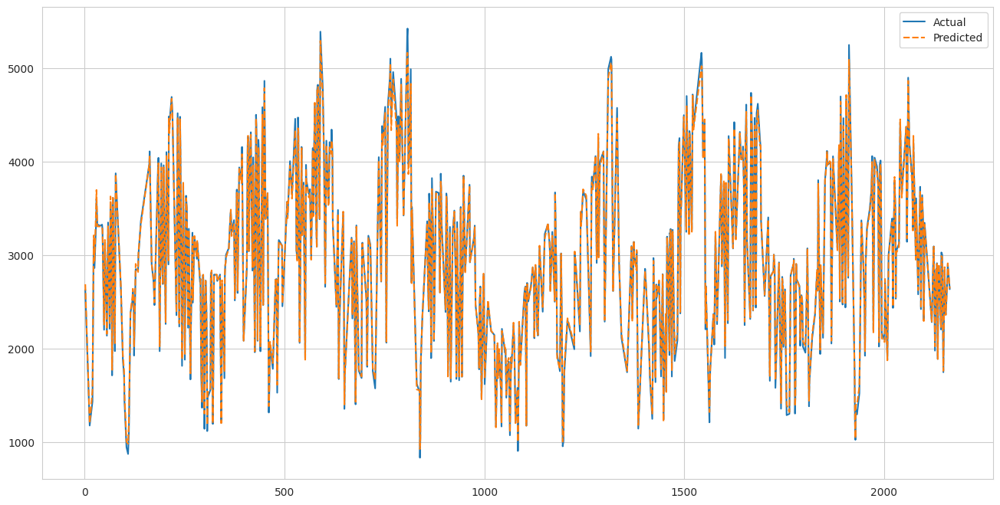

In [41]:
plt.figure(figsize=(16,8))
sns.lineplot(data=xgb_df)

In [44]:
xgb_r.score(X_test,y_test)*100

99.7781428024197